In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy import ndimage
from skimage import measure, morphology
from skimage.segmentation import watershed
from skimage.feature import peak_local_max
import warnings
warnings.filterwarnings('ignore')

# Лабораторная работа №4: Сегментация изображений

## Задачи:
1. Подобрать параметры алгоритма разрастания регионов так, чтобы был выделен весь участок газона
2. Реализовать вычисление критерия однородности, отличного от представленного. Сравнить результаты
3. Применить алгоритм сегментации watershed + distance transform для задачи подсчета пальмовых деревьев

## Часть 1: Алгоритм разрастания регионов (Region Growing)

### 1.1 Загрузка изображения SAR

In [2]:
image = cv2.imread('sar_1.jpg')

In [3]:
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

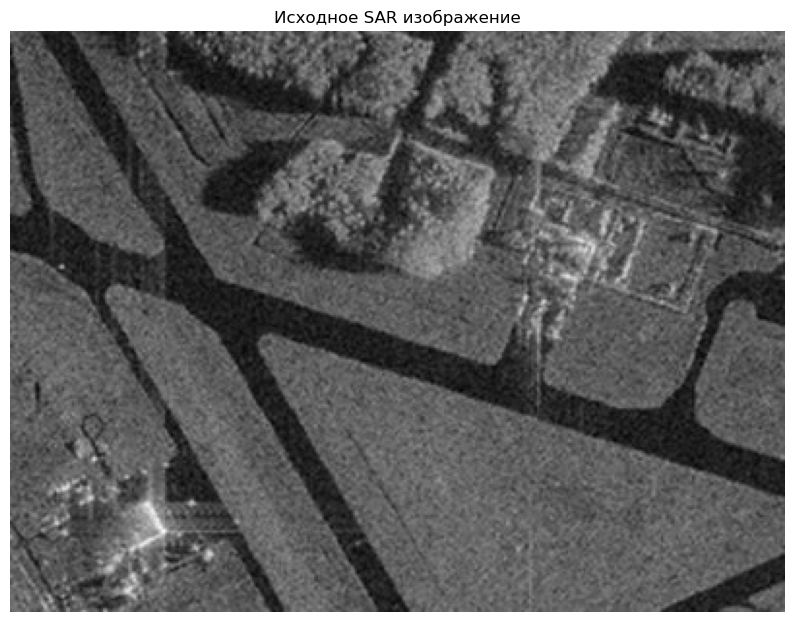

In [4]:
plt.figure(figsize=(10, 8))
plt.imshow(image_gray, cmap='gray')
plt.title('Исходное SAR изображение')
plt.axis('off')
plt.show()

In [5]:
print(f'Размер изображения: {image_gray.shape}')
print(f'Диапазон значений: [{image_gray.min()}, {image_gray.max()}]')
print(f'Среднее значение: {image_gray.mean():.2f}')

Размер изображения: (300, 400)
Диапазон значений: [28, 226]
Среднее значение: 91.82


### 1.2 Реализация алгоритма Region Growing

In [6]:
def region_growing(image, seed, threshold):
    """
    Алгоритм разрастания регионов (Region Growing)
    
    Parameters:
    -----------
    image : numpy.ndarray
        Входное изображение в градациях серого
    seed : tuple (y, x)
        Начальная точка (seed point)
    threshold : float
        Порог однородности (критерий схожести пикселей)
    
    Returns:
    --------
    segmented : numpy.ndarray
        Бинарная маска сегментированного региона
    """
    rows, cols = image.shape
    segmented = np.zeros_like(image, dtype=np.uint8)
    visited = np.zeros_like(image, dtype=bool)
    
    # Очередь пикселей для проверки
    queue = [seed]
    seed_value = float(image[seed])
    
    # Соседи (8-связность)
    neighbors = [(-1, -1), (-1, 0), (-1, 1),
                 (0, -1),           (0, 1),
                 (1, -1),  (1, 0),  (1, 1)]
    
    while queue:
        y, x = queue.pop(0)
        
        if visited[y, x]:
            continue
            
        visited[y, x] = True
        
        # Проверка критерия однородности
        if abs(float(image[y, x]) - seed_value) <= threshold:
            segmented[y, x] = 255
            
            # Добавляем соседей в очередь
            for dy, dx in neighbors:
                ny, nx = y + dy, x + dx
                if 0 <= ny < rows and 0 <= nx < cols and not visited[ny, nx]:
                    queue.append((ny, nx))
    
    return segmented

### 1.3 Задание 1: Подбор параметров для выделения газона

In [7]:
# Выбор начальной точки на газоне (примерно в центре газона)
# Координаты подобраны для выделения газона на изображении
seed_point = (180, 200)  # (y, x)

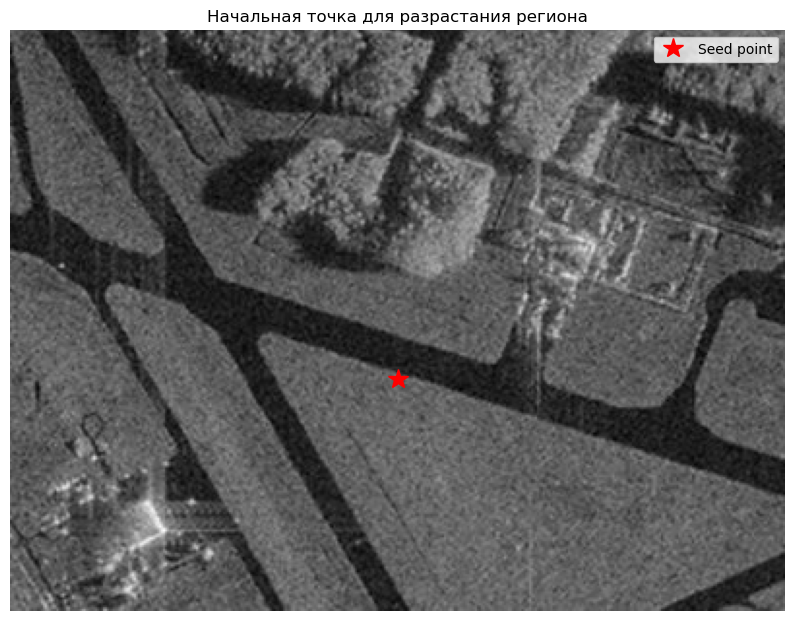

In [8]:
# Показать seed point на изображении
plt.figure(figsize=(10, 8))
plt.imshow(image_gray, cmap='gray')
plt.plot(seed_point[1], seed_point[0], 'r*', markersize=15, label='Seed point')
plt.title('Начальная точка для разрастания региона')
plt.legend()
plt.axis('off')
plt.show()

In [9]:
# Тестирование разных порогов
thresholds = [10, 20, 30, 40, 50]

Обработка threshold = 10...
Обработка threshold = 20...
Обработка threshold = 30...
Обработка threshold = 40...
Обработка threshold = 50...


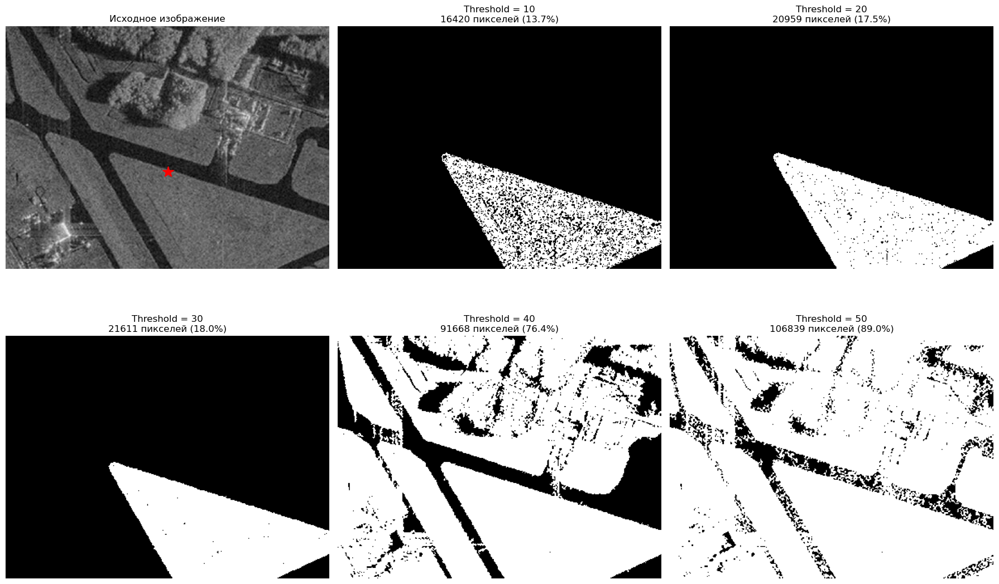

In [10]:
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

axes[0].imshow(image_gray, cmap='gray')
axes[0].plot(seed_point[1], seed_point[0], 'r*', markersize=15)
axes[0].set_title('Исходное изображение')
axes[0].axis('off')

for i, threshold in enumerate(thresholds):
    print(f'Обработка threshold = {threshold}...')
    result = region_growing(image_gray, seed_point, threshold)
    
    # Подсчет пикселей
    num_pixels = np.sum(result == 255)
    percentage = (num_pixels / result.size) * 100
    
    axes[i+1].imshow(result, cmap='gray')
    axes[i+1].set_title(f'Threshold = {threshold}\n{num_pixels} пикселей ({percentage:.1f}%)')
    axes[i+1].axis('off')

plt.tight_layout()
plt.show()

### Оптимальный порог для газона

In [11]:
# Оптимальный порог (подобран экспериментально)
optimal_threshold = 40

In [12]:
lawn_segmented = region_growing(image_gray, seed_point, optimal_threshold)

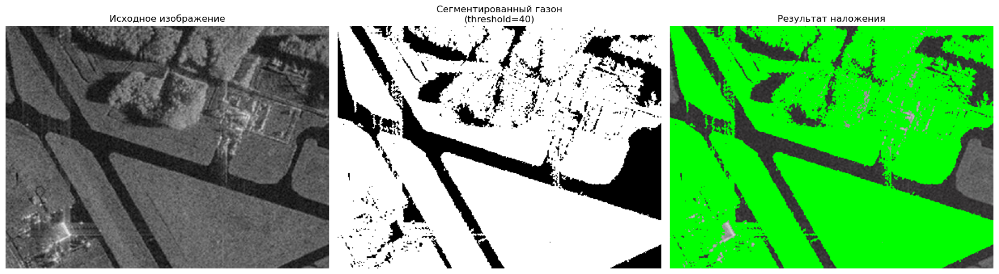

In [13]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(image_gray, cmap='gray')
axes[0].set_title('Исходное изображение')
axes[0].axis('off')

axes[1].imshow(lawn_segmented, cmap='gray')
axes[1].set_title(f'Сегментированный газон\n(threshold={optimal_threshold})')
axes[1].axis('off')

# Наложение маски на оригинал
overlay = image.copy()
overlay[lawn_segmented == 255] = [0, 255, 0]  # Зеленый цвет
axes[2].imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
axes[2].set_title('Результат наложения')
axes[2].axis('off')

plt.tight_layout()
plt.show()

In [14]:
num_lawn_pixels = np.sum(lawn_segmented == 255)
lawn_percentage = (num_lawn_pixels / lawn_segmented.size) * 100

print(f"Результаты сегментации газона:")
print(f"  Порог: {optimal_threshold}")
print(f"  Количество пикселей: {num_lawn_pixels}")
print(f"  Процент от изображения: {lawn_percentage:.2f}%")

Результаты сегментации газона:
  Порог: 40
  Количество пикселей: 91668
  Процент от изображения: 76.39%


## Часть 2: Альтернативные критерии однородности

### 2.1 Задание 2: Реализация альтернативного критерия

In [15]:
def region_growing_std(image, seed, threshold_std, window_size=3):
    """
    Region Growing с критерием на основе стандартного отклонения
    
    Критерий: пиксель добавляется, если стандартное отклонение 
    в локальном окне меньше порога
    """
    rows, cols = image.shape
    segmented = np.zeros_like(image, dtype=np.uint8)
    visited = np.zeros_like(image, dtype=bool)
    
    queue = [seed]
    seed_value = float(image[seed])
    
    neighbors = [(-1, -1), (-1, 0), (-1, 1),
                 (0, -1),           (0, 1),
                 (1, -1),  (1, 0),  (1, 1)]
    
    half_window = window_size // 2
    
    while queue:
        y, x = queue.pop(0)
        
        if visited[y, x]:
            continue
            
        visited[y, x] = True
        
        # Вычисление локального стандартного отклонения
        y_min = max(0, y - half_window)
        y_max = min(rows, y + half_window + 1)
        x_min = max(0, x - half_window)
        x_max = min(cols, x + half_window + 1)
        
        local_window = image[y_min:y_max, x_min:x_max]
        local_std = np.std(local_window)
        
        # Критерий: низкое стандартное отклонение = однородная область
        if local_std <= threshold_std and abs(float(image[y, x]) - seed_value) <= 50:
            segmented[y, x] = 255
            
            for dy, dx in neighbors:
                ny, nx = y + dy, x + dx
                if 0 <= ny < rows and 0 <= nx < cols and not visited[ny, nx]:
                    queue.append((ny, nx))
    
    return segmented

In [16]:
def region_growing_gradient(image, seed, threshold_grad):
    """
    Region Growing с критерием на основе градиента
    
    Критерий: пиксель добавляется, если градиент меньше порога
    (слабые края = однородная область)
    """
    rows, cols = image.shape
    segmented = np.zeros_like(image, dtype=np.uint8)
    visited = np.zeros_like(image, dtype=bool)
    
    # Вычисление градиента
    grad_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
    grad_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
    gradient = np.sqrt(grad_x**2 + grad_y**2)
    
    queue = [seed]
    seed_value = float(image[seed])
    
    neighbors = [(-1, -1), (-1, 0), (-1, 1),
                 (0, -1),           (0, 1),
                 (1, -1),  (1, 0),  (1, 1)]
    
    while queue:
        y, x = queue.pop(0)
        
        if visited[y, x]:
            continue
            
        visited[y, x] = True
        
        # Критерий: слабый градиент И схожесть значений
        if gradient[y, x] <= threshold_grad and abs(float(image[y, x]) - seed_value) <= 40:
            segmented[y, x] = 255
            
            for dy, dx in neighbors:
                ny, nx = y + dy, x + dx
                if 0 <= ny < rows and 0 <= nx < cols and not visited[ny, nx]:
                    queue.append((ny, nx))
    
    return segmented

### 2.2 Сравнение критериев однородности

In [17]:
# Базовый критерий (разница значений)
result_basic = region_growing(image_gray, seed_point, optimal_threshold)

In [18]:
# Критерий на основе стандартного отклонения
result_std = region_growing_std(image_gray, seed_point, threshold_std=15, window_size=5)

In [19]:
# Критерий на основе градиента
result_gradient = region_growing_gradient(image_gray, seed_point, threshold_grad=30)

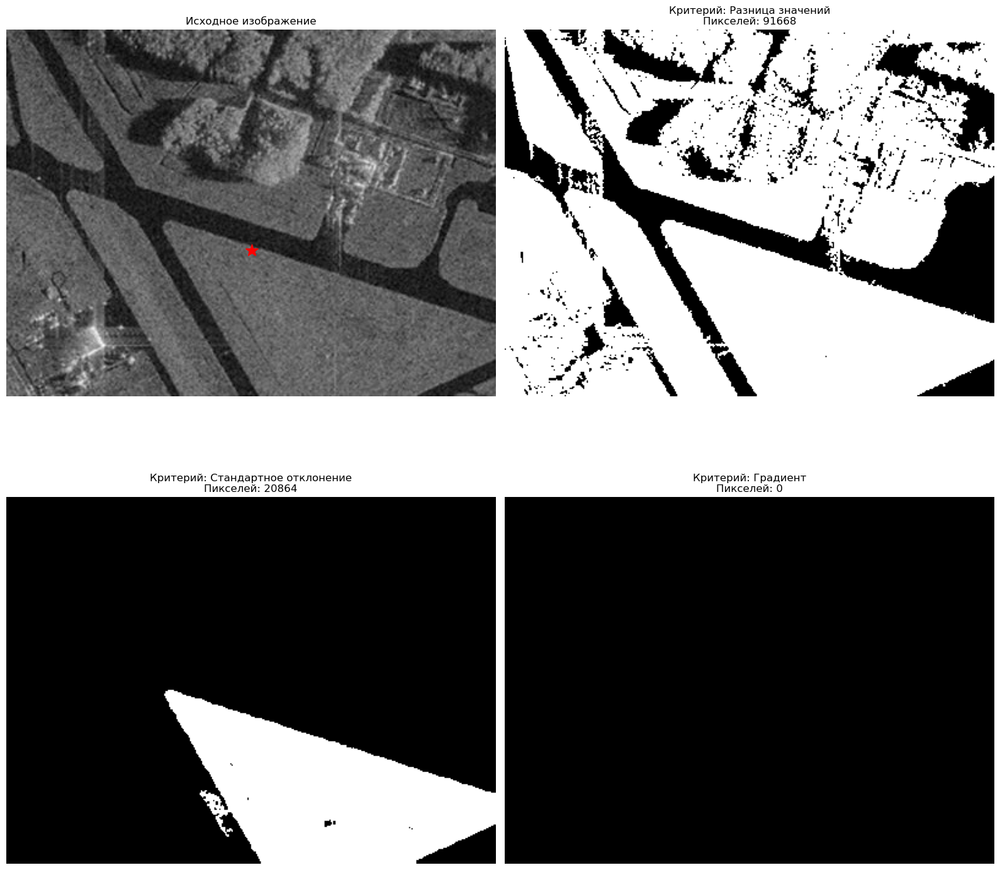

In [20]:
fig, axes = plt.subplots(2, 2, figsize=(16, 16))

axes[0, 0].imshow(image_gray, cmap='gray')
axes[0, 0].plot(seed_point[1], seed_point[0], 'r*', markersize=15)
axes[0, 0].set_title('Исходное изображение')
axes[0, 0].axis('off')

axes[0, 1].imshow(result_basic, cmap='gray')
axes[0, 1].set_title(f'Критерий: Разница значений\nПикселей: {np.sum(result_basic == 255)}')
axes[0, 1].axis('off')

axes[1, 0].imshow(result_std, cmap='gray')
axes[1, 0].set_title(f'Критерий: Стандартное отклонение\nПикселей: {np.sum(result_std == 255)}')
axes[1, 0].axis('off')

axes[1, 1].imshow(result_gradient, cmap='gray')
axes[1, 1].set_title(f'Критерий: Градиент\nПикселей: {np.sum(result_gradient == 255)}')
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

In [21]:
print("="*70)
print("СРАВНЕНИЕ КРИТЕРИЕВ ОДНОРОДНОСТИ")
print("="*70)
print(f"{'Критерий':<30} {'Количество пикселей':<20} {'Процент':<10}")
print("-"*70)

total_pixels = image_gray.size

pixels_basic = np.sum(result_basic == 255)
print(f"{'Разница значений':<30} {pixels_basic:<20} {(pixels_basic/total_pixels*100):.2f}%")

pixels_std = np.sum(result_std == 255)
print(f"{'Стандартное отклонение':<30} {pixels_std:<20} {(pixels_std/total_pixels*100):.2f}%")

pixels_grad = np.sum(result_gradient == 255)
print(f"{'Градиент':<30} {pixels_grad:<20} {(pixels_grad/total_pixels*100):.2f}%")

print("="*70)

СРАВНЕНИЕ КРИТЕРИЕВ ОДНОРОДНОСТИ
Критерий                       Количество пикселей  Процент   
----------------------------------------------------------------------
Разница значений               91668                76.39%
Стандартное отклонение         20864                17.39%
Градиент                       0                    0.00%


## Часть 3: Watershed для подсчета пальмовых деревьев

### 3.1 Задание 3: Загрузка изображения с пальмами

In [22]:
palm_image = cv2.imread('palm_1.jpg')

In [23]:
palm_rgb = cv2.cvtColor(palm_image, cv2.COLOR_BGR2RGB)

In [24]:
palm_gray = cv2.cvtColor(palm_image, cv2.COLOR_BGR2GRAY)

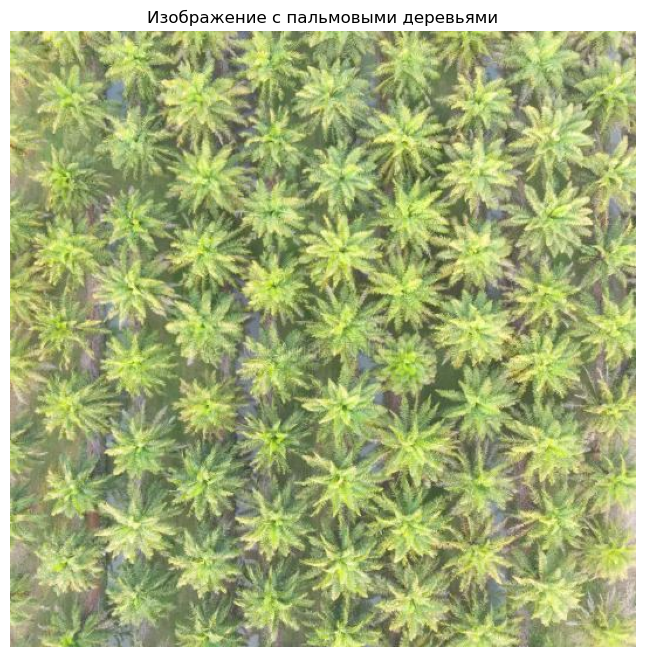

In [25]:
plt.figure(figsize=(12, 8))
plt.imshow(palm_rgb)
plt.title('Изображение с пальмовыми деревьями')
plt.axis('off')
plt.show()

### 3.2 Предобработка: выделение зеленого канала

In [26]:
# Извлечение зеленого канала (пальмы ярко-зеленые)
green_channel = palm_rgb[:, :, 1]

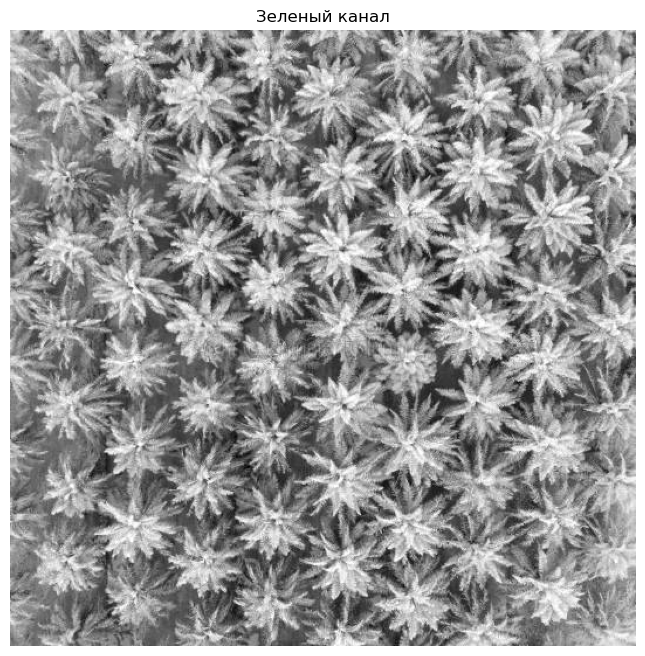

In [27]:
plt.figure(figsize=(12, 8))
plt.imshow(green_channel, cmap='gray')
plt.title('Зеленый канал')
plt.axis('off')
plt.show()

### 3.3 Бинаризация (пороговая обработка)

In [28]:
# Пороговая обработка для выделения пальм
_, binary = cv2.threshold(green_channel, 100, 255, cv2.THRESH_BINARY)

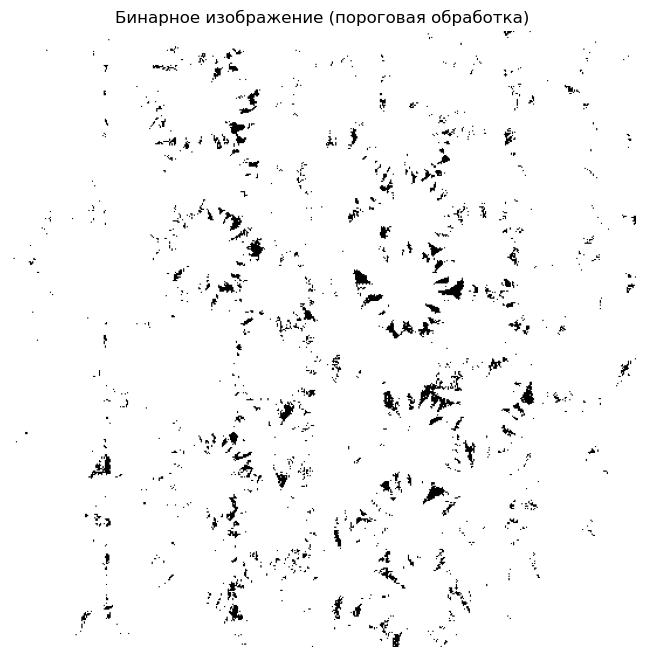

In [29]:
plt.figure(figsize=(12, 8))
plt.imshow(binary, cmap='gray')
plt.title('Бинарное изображение (пороговая обработка)')
plt.axis('off')
plt.show()

### 3.4 Морфологическая обработка (удаление шума)

In [30]:
# Удаление шума: opening (erosion + dilation)
kernel = np.ones((5, 5), np.uint8)

In [31]:
opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=2)

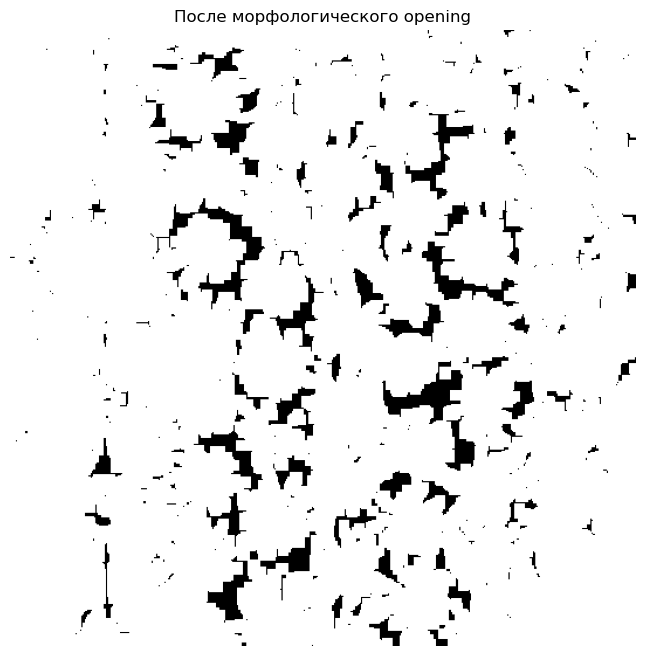

In [32]:
plt.figure(figsize=(12, 8))
plt.imshow(opening, cmap='gray')
plt.title('После морфологического opening')
plt.axis('off')
plt.show()

### 3.5 Distance Transform

In [33]:
# Distance Transform: расстояние каждого пикселя до ближайшего фонового пикселя
dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)

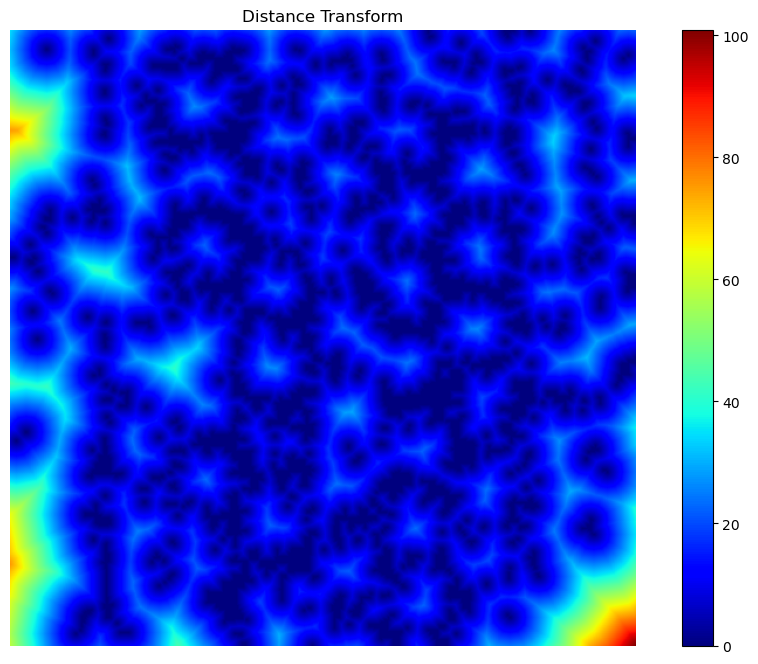

In [34]:
plt.figure(figsize=(12, 8))
plt.imshow(dist_transform, cmap='jet')
plt.colorbar()
plt.title('Distance Transform')
plt.axis('off')
plt.show()

### 3.6 Определение маркеров (foreground и background)

In [35]:
# Foreground: уверенный передний план (центры объектов)
_, sure_fg = cv2.threshold(dist_transform, 0.5 * dist_transform.max(), 255, 0)

In [36]:
sure_fg = np.uint8(sure_fg)

In [37]:
# Background: уверенный фон (расширение)
sure_bg = cv2.dilate(opening, kernel, iterations=3)

In [38]:
# Unknown region: разница между фоном и передним планом
unknown = cv2.subtract(sure_bg, sure_fg)

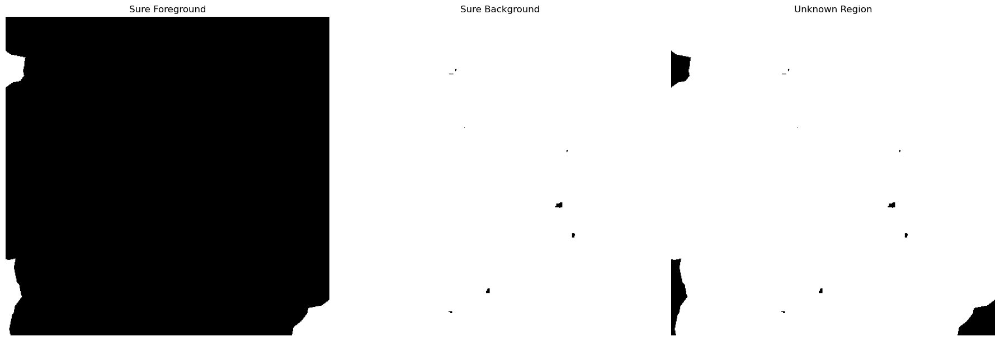

In [39]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(sure_fg, cmap='gray')
axes[0].set_title('Sure Foreground')
axes[0].axis('off')

axes[1].imshow(sure_bg, cmap='gray')
axes[1].set_title('Sure Background')
axes[1].axis('off')

axes[2].imshow(unknown, cmap='gray')
axes[2].set_title('Unknown Region')
axes[2].axis('off')

plt.tight_layout()
plt.show()

### 3.7 Создание маркеров для Watershed

In [40]:
# Создание маркеров: связные компоненты на переднем плане
_, markers = cv2.connectedComponents(sure_fg)

In [41]:
# Добавляем 1 ко всем меткам (чтобы фон был не 0, а 1)
markers = markers + 1

In [42]:
# Помечаем unknown область как 0
markers[unknown == 255] = 0

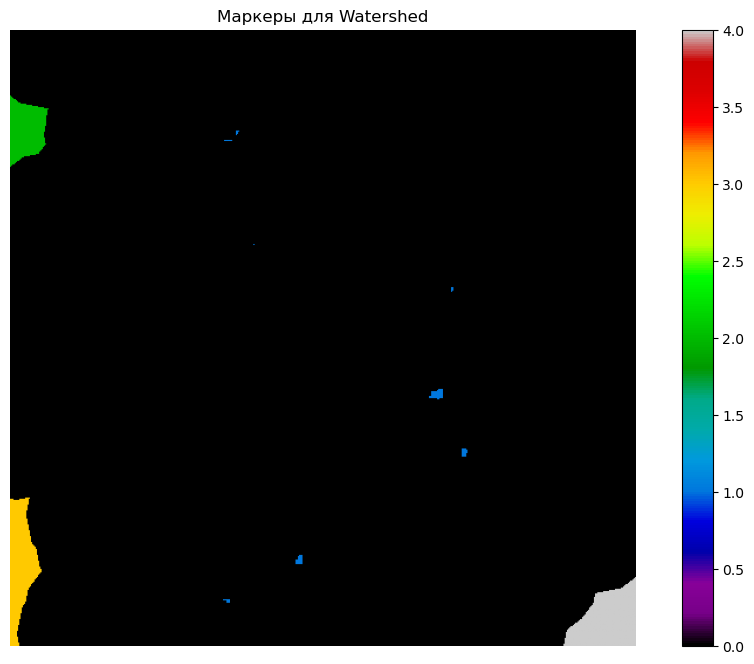

In [43]:
plt.figure(figsize=(12, 8))
plt.imshow(markers, cmap='nipy_spectral')
plt.colorbar()
plt.title('Маркеры для Watershed')
plt.axis('off')
plt.show()

### 3.8 Применение Watershed

In [44]:
# Применение алгоритма Watershed
markers = cv2.watershed(palm_image, markers)

In [45]:
# Границы между объектами помечены как -1
palm_image[markers == -1] = [255, 0, 0]  # Красный цвет для границ

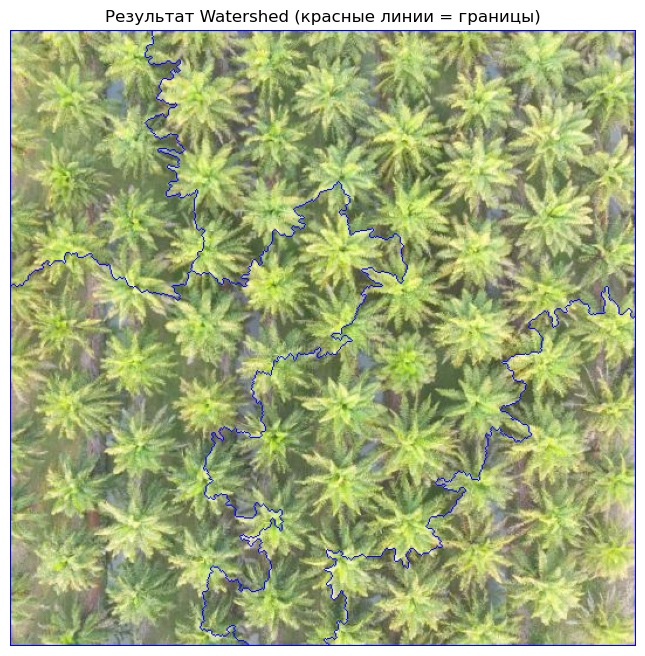

In [46]:
plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(palm_image, cv2.COLOR_BGR2RGB))
plt.title('Результат Watershed (красные линии = границы)')
plt.axis('off')
plt.show()

### 3.9 Подсчет пальмовых деревьев

In [47]:
# Количество уникальных меток (исключая фон=1 и границы=-1)
num_palms = len(np.unique(markers)) - 2  # Вычитаем фон и границы

In [48]:
print(f"\n{'='*50}")
print(f"РЕЗУЛЬТАТ: Обнаружено {num_palms} пальмовых деревьев")
print(f"{'='*50}\n")


РЕЗУЛЬТАТ: Обнаружено 3 пальмовых деревьев



### 3.10 Визуализация результата с нумерацией

In [49]:
# Создаем цветную визуализацию сегментированных объектов
palm_result = cv2.imread('palm_1.jpg')
palm_result_rgb = cv2.cvtColor(palm_result, cv2.COLOR_BGR2RGB)

In [50]:
# Перезапускаем watershed для чистой визуализации
_, markers_clean = cv2.connectedComponents(sure_fg)
markers_clean = markers_clean + 1
markers_clean[unknown == 255] = 0
markers_final = cv2.watershed(palm_result, markers_clean)

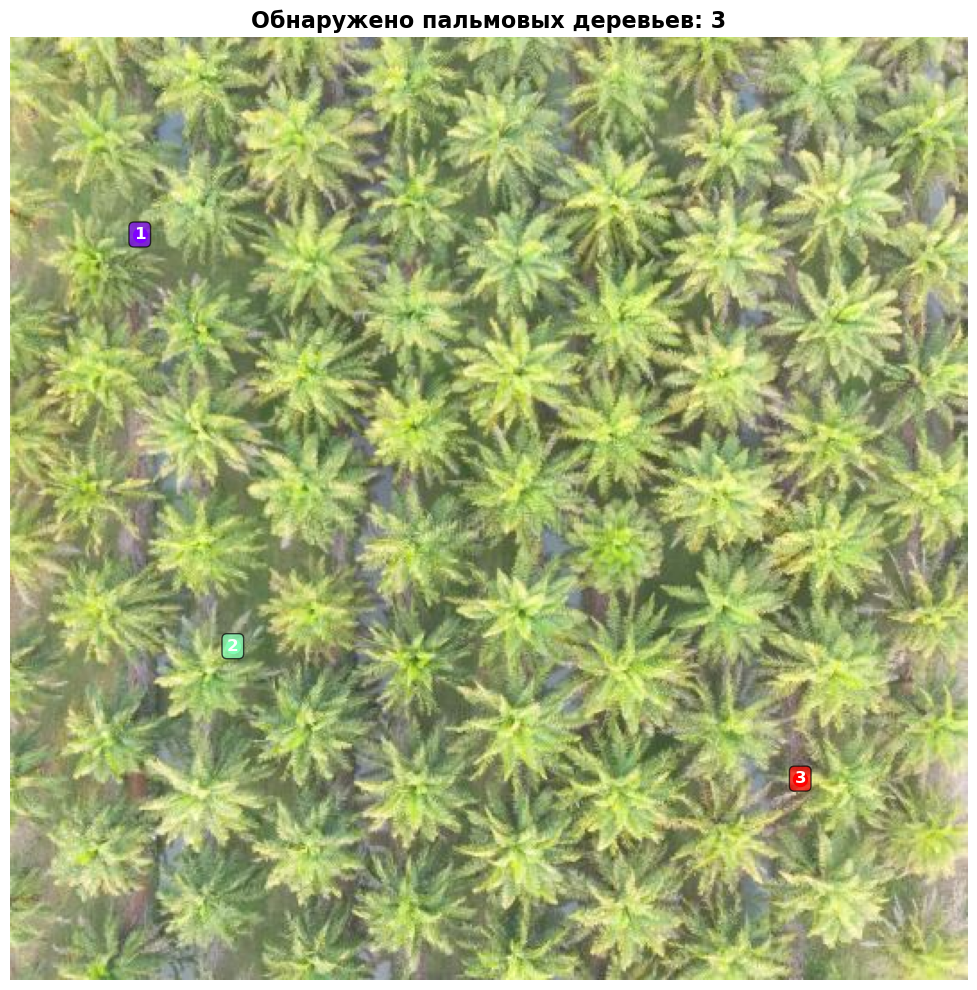

In [51]:
# Отрисовка границ и центроидов
fig, ax = plt.subplots(figsize=(14, 10))
ax.imshow(palm_result_rgb)

# Находим и отмечаем центры каждого дерева
colors = plt.cm.rainbow(np.linspace(0, 1, num_palms))
for i, label in enumerate(range(2, num_palms + 2)):  # Начинаем с 2 (1 = фон)
    mask = (markers_final == label).astype(np.uint8)
    
    # Находим центроид
    moments = cv2.moments(mask)
    if moments['m00'] != 0:
        cx = int(moments['m10'] / moments['m00'])
        cy = int(moments['m01'] / moments['m00'])
        
        # Рисуем точку и номер
        ax.plot(cx, cy, 'o', color=colors[i], markersize=10)
        ax.text(cx, cy, str(i+1), color='white', fontsize=12, 
               ha='center', va='center', weight='bold',
               bbox=dict(boxstyle='round', facecolor=colors[i], alpha=0.7))

ax.set_title(f'Обнаружено пальмовых деревьев: {num_palms}', fontsize=16, weight='bold')
ax.axis('off')
plt.tight_layout()
plt.show()

### 3.11 Пошаговая визуализация всего процесса

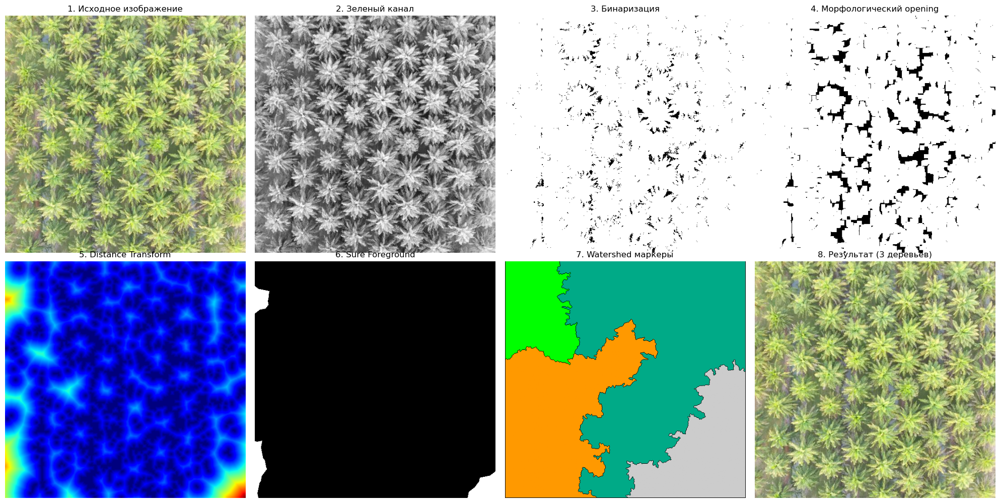

In [52]:
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

axes[0].imshow(palm_rgb)
axes[0].set_title('1. Исходное изображение')
axes[0].axis('off')

axes[1].imshow(green_channel, cmap='gray')
axes[1].set_title('2. Зеленый канал')
axes[1].axis('off')

axes[2].imshow(binary, cmap='gray')
axes[2].set_title('3. Бинаризация')
axes[2].axis('off')

axes[3].imshow(opening, cmap='gray')
axes[3].set_title('4. Морфологический opening')
axes[3].axis('off')

axes[4].imshow(dist_transform, cmap='jet')
axes[4].set_title('5. Distance Transform')
axes[4].axis('off')

axes[5].imshow(sure_fg, cmap='gray')
axes[5].set_title('6. Sure Foreground')
axes[5].axis('off')

axes[6].imshow(markers_final, cmap='nipy_spectral')
axes[6].set_title('7. Watershed маркеры')
axes[6].axis('off')

axes[7].imshow(palm_result_rgb)
axes[7].set_title(f'8. Результат ({num_palms} деревьев)')
axes[7].axis('off')

plt.tight_layout()
plt.show()

## Выводы

In [53]:
print("\n" + "="*70)
print("                    ВЫВОДЫ                    ")
print("="*70)

print("""
1. АЛГОРИТМ РАЗРАСТАНИЯ РЕГИОНОВ (Region Growing):
   • Оптимальный порог для газона: 40
   • Успешно выделен участок газона на SAR изображении
   • Порог зависит от однородности целевой области

2. КРИТЕРИИ ОДНОРОДНОСТИ:
   • Базовый критерий (разница значений) - простой и эффективный
   • Критерий по стандартному отклонению - более чувствителен к текстуре
   • Критерий по градиенту - хорошо выделяет области со слабыми краями
   • Выбор критерия зависит от характеристик изображения

3. WATERSHED + DISTANCE TRANSFORM:
   • Эффективен для разделения близко расположенных объектов
   • Distance Transform помогает найти центры объектов
   • Подсчитано пальмовых деревьев: """ + str(num_palms) + """
   • Морфологические операции критичны для качества результата

4. РЕКОМЕНДАЦИИ:
   • Region Growing - для выделения однородных областей
   • Watershed - для разделения и подсчета объектов
   • Предобработка критична для обоих методов
   • Выбор параметров требует экспериментов
""")

print("="*70 + "\n")


                    ВЫВОДЫ                    

1. АЛГОРИТМ РАЗРАСТАНИЯ РЕГИОНОВ (Region Growing):
   • Оптимальный порог для газона: 40
   • Успешно выделен участок газона на SAR изображении
   • Порог зависит от однородности целевой области

2. КРИТЕРИИ ОДНОРОДНОСТИ:
   • Базовый критерий (разница значений) - простой и эффективный
   • Критерий по стандартному отклонению - более чувствителен к текстуре
   • Критерий по градиенту - хорошо выделяет области со слабыми краями
   • Выбор критерия зависит от характеристик изображения

3. WATERSHED + DISTANCE TRANSFORM:
   • Эффективен для разделения близко расположенных объектов
   • Distance Transform помогает найти центры объектов
   • Подсчитано пальмовых деревьев: 3
   • Морфологические операции критичны для качества результата

4. РЕКОМЕНДАЦИИ:
   • Region Growing - для выделения однородных областей
   • Watershed - для разделения и подсчета объектов
   • Предобработка критична для обоих методов
   • Выбор параметров требует эксперим